In [1]:
file_content = ""
with open('pg244.txt', 'r', encoding='utf-8') as file:
    file_content = file.read()

We're begining by cutting out project gutrenberg header and footer and then we split the book into documents, each chapter on its own<br>
We also remove first few documents as they are only from the contents section 

In [2]:
import re
documents = re.split("CHAPTER [A-Z]+\.", file_content.split("***")[2])[15:]

<>:2: SyntaxWarning: invalid escape sequence '\.'
<>:2: SyntaxWarning: invalid escape sequence '\.'
/tmp/nix-shell.jI9aG6/ipykernel_10929/1162688238.py:2: SyntaxWarning: invalid escape sequence '\.'
  documents = re.split("CHAPTER [A-Z]+\.", file_content.split("***")[2])[15:]


Now we can split each document into list of words while turning all letters to lower case and removing all puncuations

In [3]:
chapter_words = []
for doc in documents:
    doc = re.sub('(\W|_)', ' ', doc)
    chapter_words.append(doc.lower().split())

<>:3: SyntaxWarning: invalid escape sequence '\W'
<>:3: SyntaxWarning: invalid escape sequence '\W'
/tmp/nix-shell.jI9aG6/ipykernel_10929/1554588161.py:3: SyntaxWarning: invalid escape sequence '\W'
  doc = re.sub('(\W|_)', ' ', doc)


Now that the we have a all lists of all words we should filter stop words out of it

In [4]:
stop_words = set()
with open('stop_words.txt', 'r', encoding='utf-8') as file:
    file_content = file.read()
    stop_words = set(file_content.splitlines())

filtered_chapter_words = [[word for word in words if word not in stop_words] for words in chapter_words]

We also can filter out different forms of the same word<br>
But I decided not to as it was filtering out main word "Holmes" and turning into "holm"

In [5]:
# from stemming.porter2 import stem
# filtered_words = [ stem ( word ) for word in filtered_words ]


Next step is to count weight of each individual word in each document and sort descending<br>

The weight of the word is calculated by the formula $weight(word, document, book) = tf\text{-}ifd(word, document, book) = tf(word, document) \times idf(word, book)$

Whis formula calculates frequency of the word in its document ($tf$) but also divides it by its popularity in other documents so ($idf$ function). This means that if a word is popular across the whole book its weight will not be as big as for a word that is frequent in only this one chapter

In [6]:
documents_pairs = []

def tf(word, document):
    return document.count(word)

def idf(word, book):
    import math
    num_documents_with_word = sum(1 for doc in book if word in doc)
    return math.log(len(book) / (1 + num_documents_with_word))

for words in filtered_chapter_words:
    words_weight = []
    for word in words:
        if word not in [w for w, _ in words_weight]:
            words_weight.append((word, tf(word, words) * idf(word, filtered_chapter_words)))
    words_weight.sort(key=lambda x: x[1], reverse=True)
    documents_pairs.append(words_weight)


Now whats left is only to save this words in a wordcloud which is made using wordcloud library 

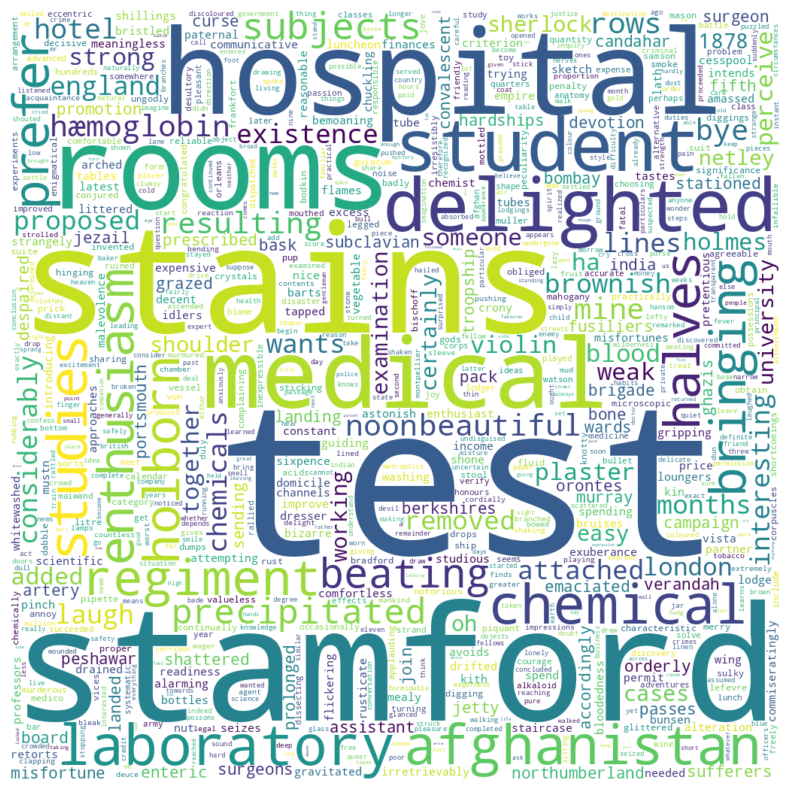

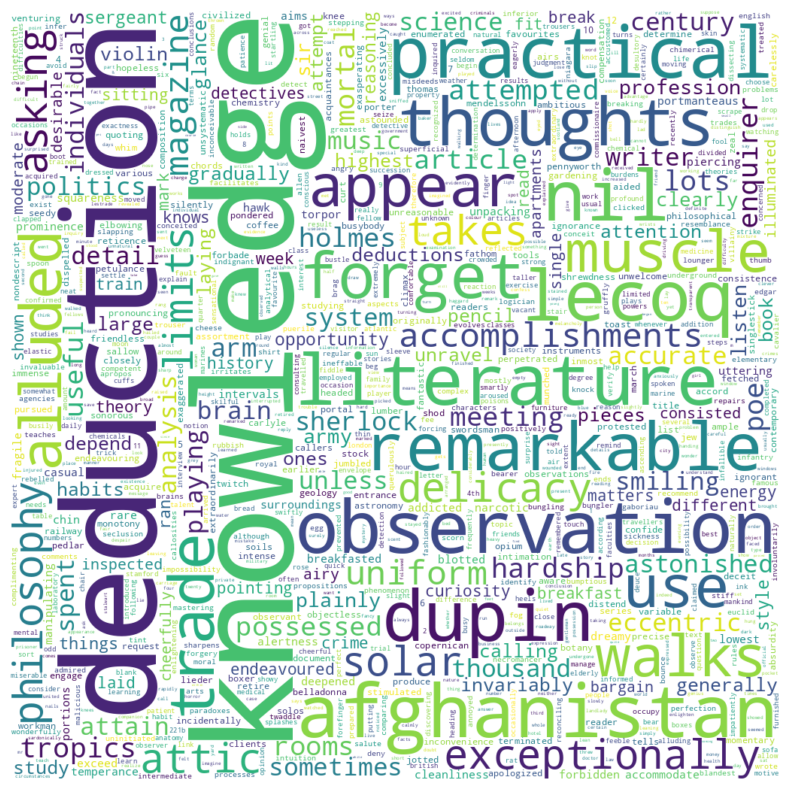

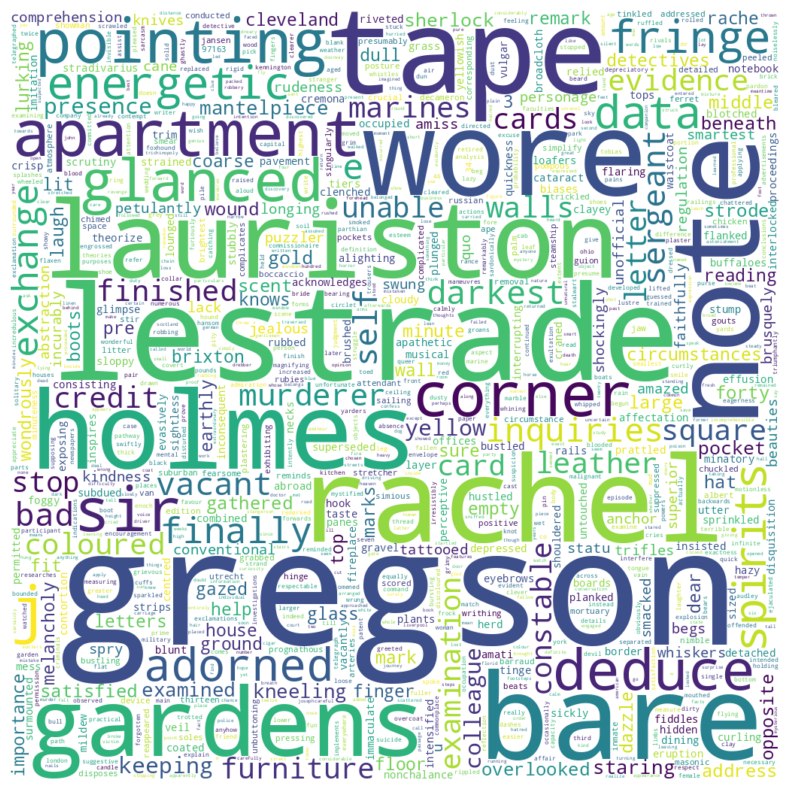

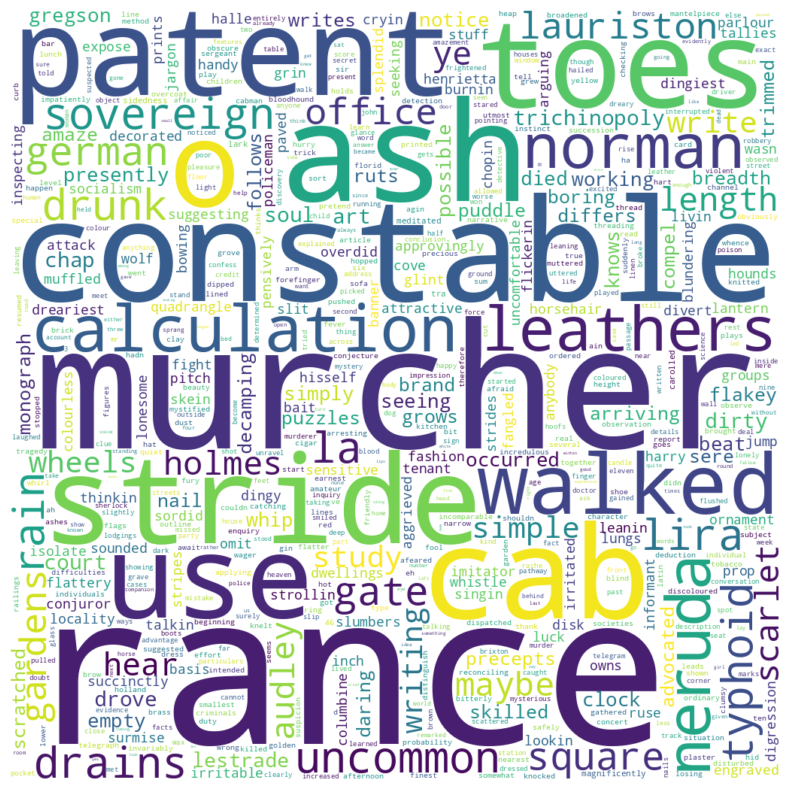

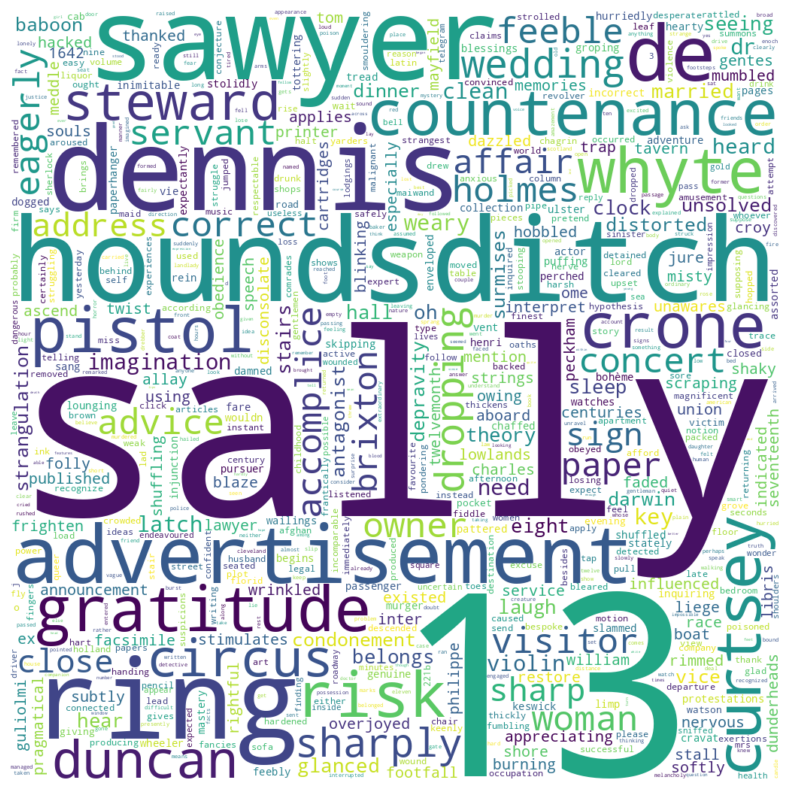

...

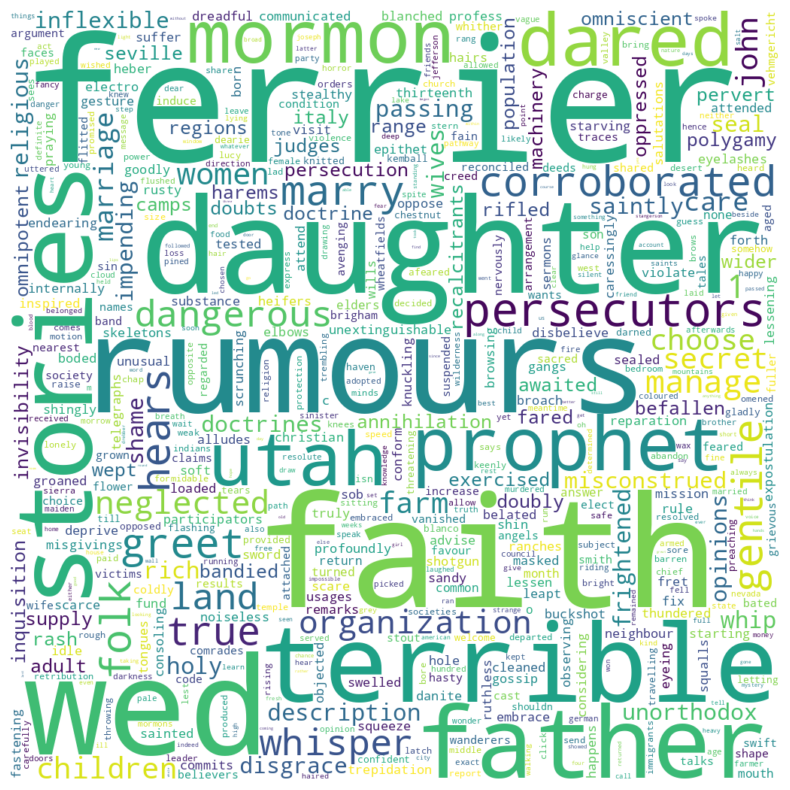

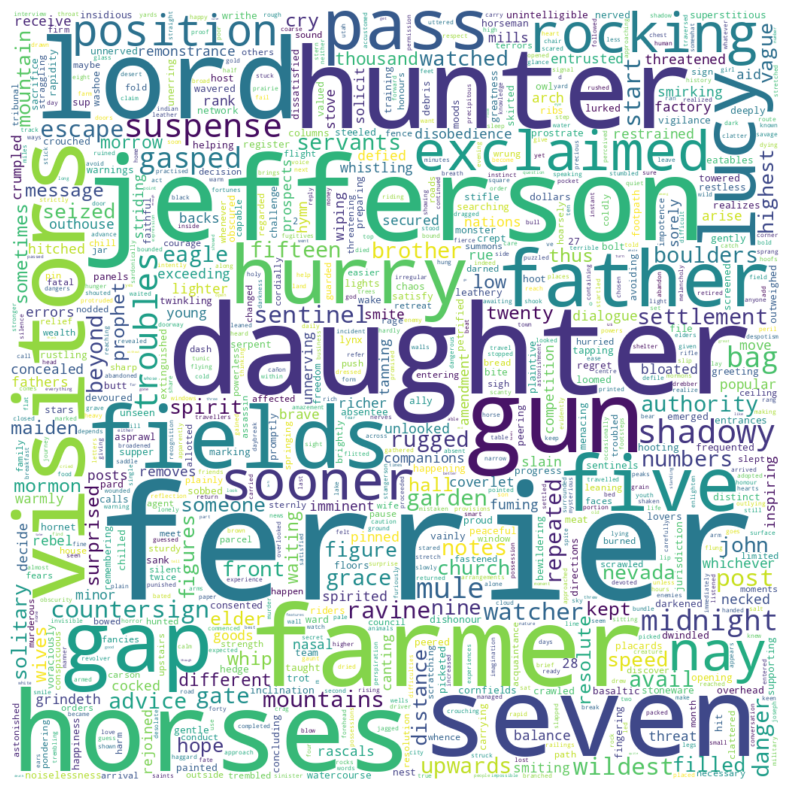

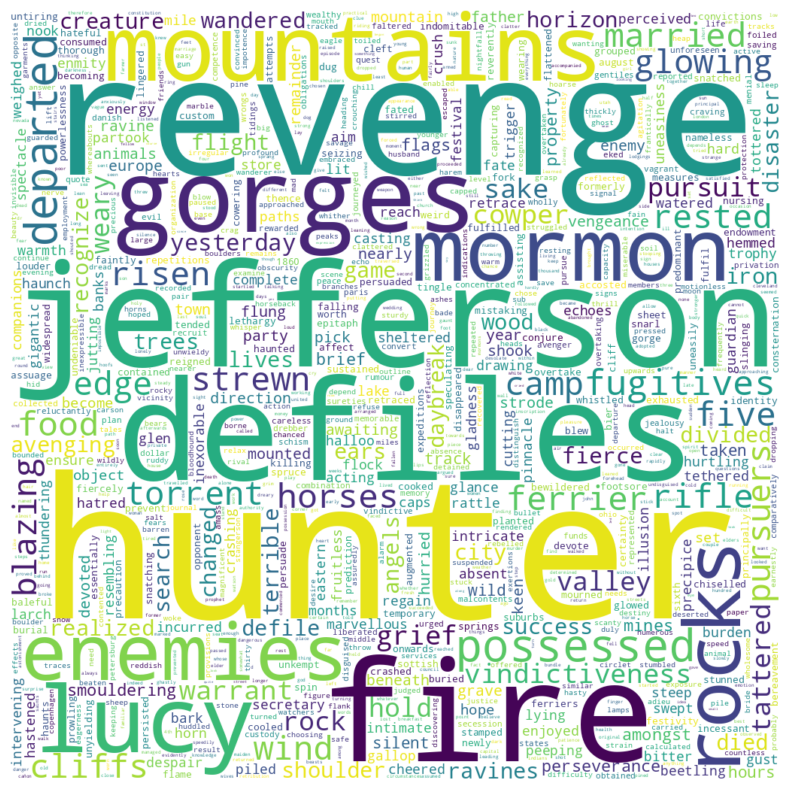

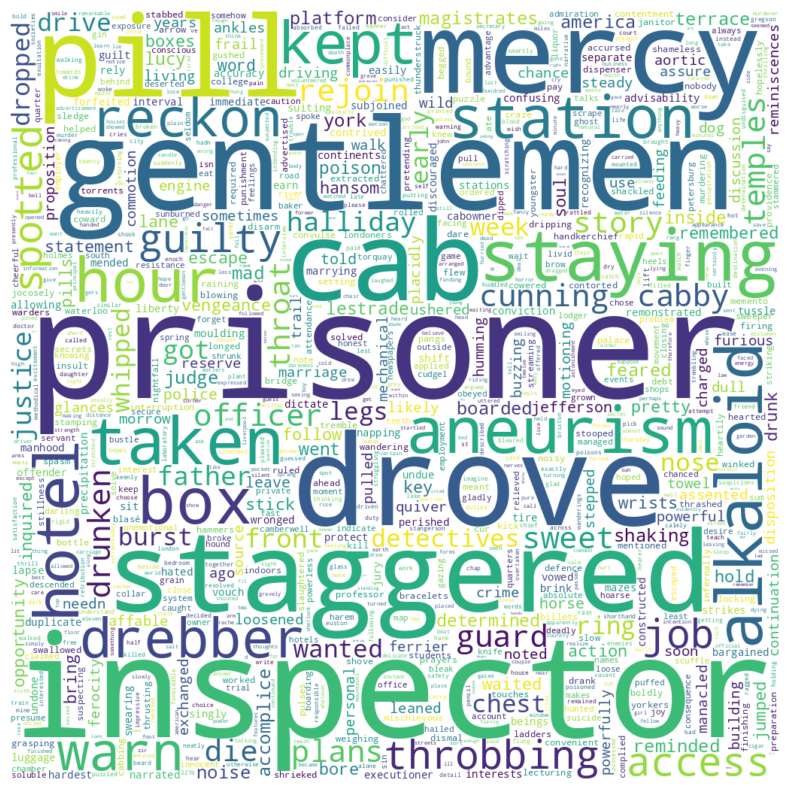

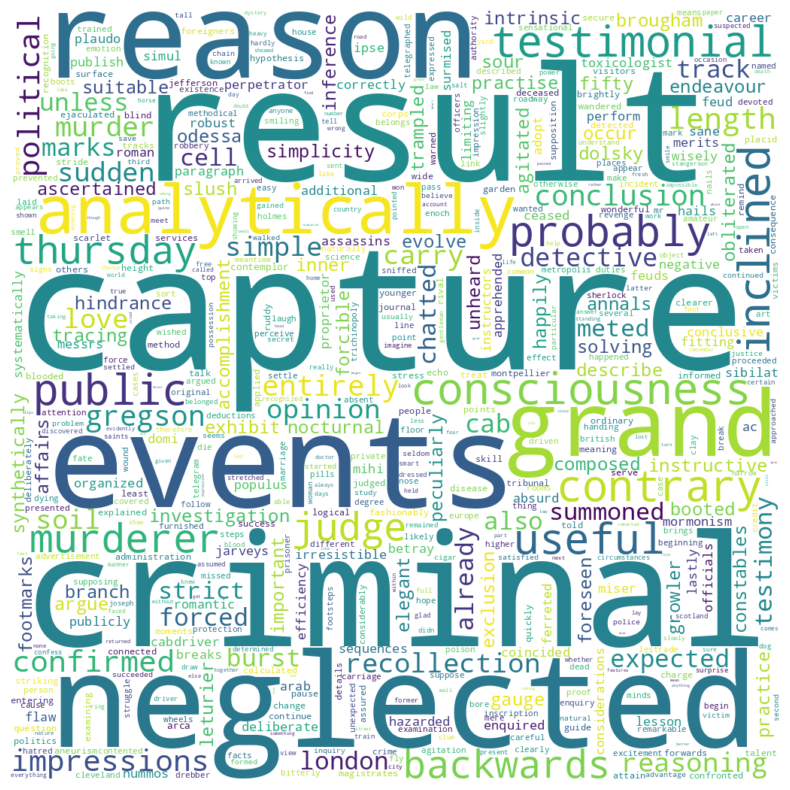

In [7]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud

for i, doc in enumerate(documents_pairs):
    wc = WordCloud(width=1024, height=1024, background_color='white', max_words=1000).generate_from_frequencies(dict(doc))
    plt.figure(figsize=(10, 10))
    plt.imshow(wc, interpolation='bilinear')
    plt.axis('off')
    plt.savefig(f'chapter_{i+1}_wordcloud6.png', format='png', dpi=300, bbox_inches='tight', pad_inches=0)